In [19]:
%load_ext zipline
%load_ext watermark
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

The zipline extension is already loaded. To reload it, use:
  %reload_ext zipline
The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark


# Импортируем библиотеки

In [20]:
import pandas as pd
import numpy as np
from collections import OrderedDict
import pytz

# необходимые функции zipline
from zipline.api import (order, record, symbol, set_benchmark, order_target_percent, get_open_orders, order_target, 
                        schedule_function, date_rules, time_rules)

# комиссии
from zipline.finance import commission

# выбор календаря по которому происходит торговля
from trading_calendars.always_open import AlwaysOpenCalendar

import zipline

# графика
import matplotlib.pyplot as plt
from matplotlib import style

# работа с временем
from datetime import datetime

# aинансовые данные
from yahoofinancials import YahooFinancials

# ignore warnings
import warnings

# отчёт
import pyfolio as pf

# import helper functions 
import qf_helper_functions as qf

In [21]:
plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 200
warnings.simplefilter(action='ignore', category=FutureWarning)

In [22]:
%watermark --iversions

pytz    2020.1
zipline 1.3.0
pyfolio v0.5.1
numpy   1.14.2
pandas  0.23.0



# Загрузка данных

In [23]:
def download_csv_data(ticker, start_date, end_date, freq, path):
    
    yahoo_financials = YahooFinancials(ticker)

    df = yahoo_financials.get_historical_price_data(start_date, end_date, freq)
    df = pd.DataFrame(df[ticker]['prices']).drop(['date'], axis=1) \
            .rename(columns={'formatted_date':'date'}) \
            .loc[:, ['date','open','high','low','close','volume']] \
            .set_index('date')
    df.index = pd.to_datetime(df.index)
    df['dividend'] = 0
    df['split'] = 1

    # save data to csv for later ingestion
    df.to_csv(path, header=True, index=True)

    # plot the time series
    df.close.plot(title='{} prices --- {}:{}'.format(ticker, start_date, end_date), color='green');

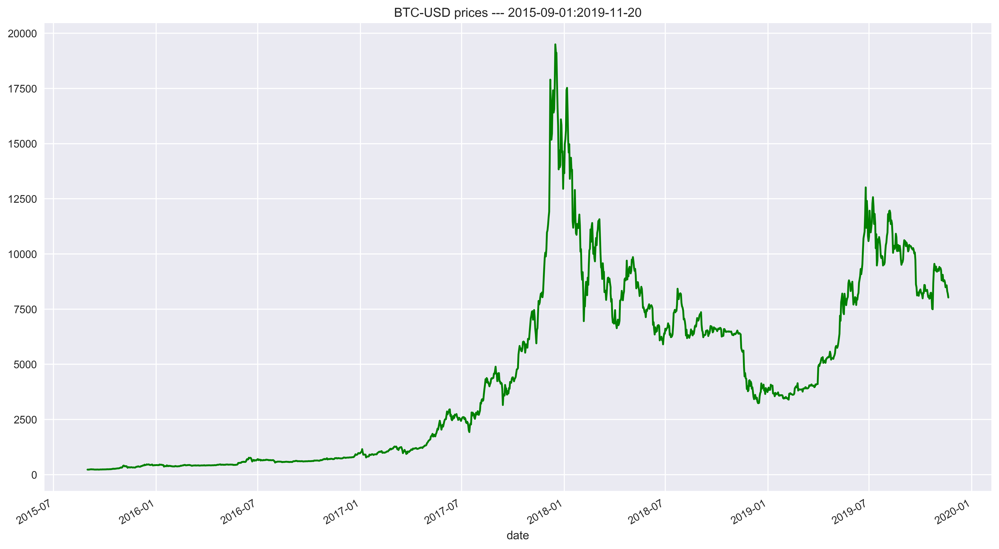

In [24]:
download_csv_data(ticker='BTC-USD', 
                  start_date='2015-09-01', 
                  end_date='2019-11-20', 
                  freq='daily', 
                  path='data/BTC.csv')

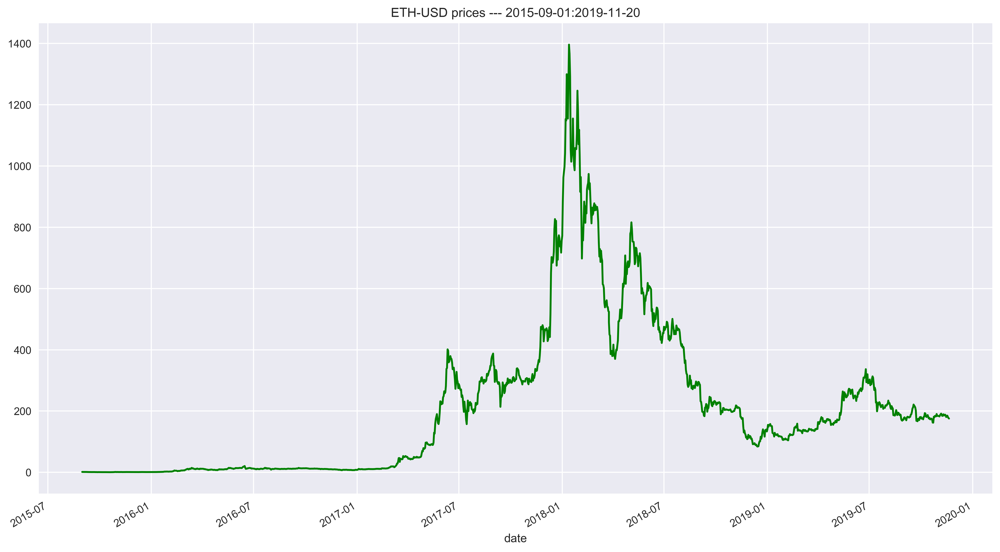

In [25]:
download_csv_data(ticker='ETH-USD', 
                  start_date='2015-09-01', 
                  end_date='2019-11-20', 
                  freq='daily', 
                  path='data/ETH.csv')

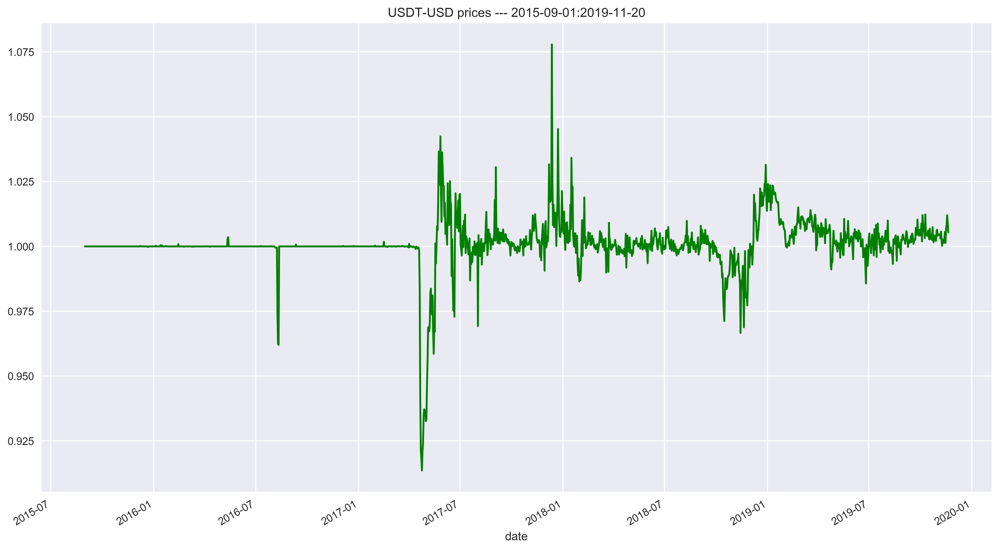

In [26]:
download_csv_data(ticker='USDT-USD', 
                  start_date='2015-09-01', 
                  end_date='2019-11-20', 
                  freq='daily', 
                  path='data/USDT.csv')

In [27]:
data = OrderedDict()

tikers = ["BTC", "ETH", "USDT"]

for tiker in tikers:
    data[tiker] = pd.read_csv("data/{}.csv".format(tiker), index_col=0, parse_dates=['date'])
    data[tiker] = data[tiker][["open","high","low","close","volume"]]
    data[tiker] = data[tiker].resample("1d").mean()
    data[tiker].fillna(method="ffill", inplace=True)
    print(data[tiker].head())

                  open        high         low       close    volume
date                                                                
2015-08-31  230.255997  231.216003  226.860001  228.121002  20575200
2015-09-01  228.026993  230.576996  226.475006  229.283997  18760400
2015-09-02  229.324005  229.604996  226.667007  227.182999  17482000
2015-09-03  227.214996  230.899994  227.050995  230.298004  20962400
2015-09-04  230.199005  236.143005  229.442993  235.018997  20671400
               open     high      low    close  volume
date                                                  
2015-08-31  1.35348  1.39274  1.33663  1.35161  778862
2015-09-01  1.35157  1.35491  1.26462  1.29479  883769
2015-09-02  1.29519  1.30999  1.21103  1.26493  702991
2015-09-03  1.26493  1.30252  1.23681  1.27441  474391
2015-09-04  1.28056  1.34230  1.27119  1.33881  448453
            open  high  low  close  volume
date                                      
2015-08-31   1.0   1.0  1.0    1.0    6135
201

In [28]:
data["BTC"].tail()

,open,high,low,close,volume
date,,,,,
2019-11-16,8491.166016,8591.997070,8473.973633,8550.760742,16495389808
2019-11-17,8549.470703,8727.789062,8500.967773,8577.975586,18668638896
2019-11-18,8573.980469,8653.280273,8273.573242,8309.286133,21579470673
2019-11-19,8305.134766,8408.516602,8099.963379,8206.145508,21083613815
2019-11-20,8203.613281,8237.240234,8010.511719,8027.268066,20764300436


In [29]:
panel = pd.Panel(data)
panel.minor_axis = ["open","high","low","close","volume"]
panel.major_axis = panel.major_axis.tz_localize(pytz.utc)
print(panel)

<class 'pandas.core.panel.Panel'>
Dimensions: 3 (items) x 1542 (major_axis) x 5 (minor_axis)
Items axis: BTC to USDT
Major_axis axis: 2015-08-31 00:00:00+00:00 to 2019-11-20 00:00:00+00:00
Minor_axis axis: open to volume


# 1. Buy And Hold Strategy

## Определяем функции алгоритма

In [30]:
# Входные параметры:
selected_stock = 'BTC'
n_stocks_to_buy = 1           # полож. число - покупка; отриц. число - продажа; 0 - продажа всего

In [31]:
# Перед запуском алгоритма zipline вызывает initialize() функцию и передает context переменную. 
# context является постоянным пространством имен для хранения переменных, к которым необходимо обращаться 
# от одной итерации алгоритма к следующей

In [32]:
def initialize(context):
    context.has_ordered = False
    #set_benchmark(symbol('SPY'))
    context.asset = symbol('BTC')
    
    # устанавливаем комиссию за сделку
    context.set_commission(commission.PerShare(cost=0, min_trade_cost=0))

In [33]:
# После того, как алгоритм был инициализирован, zipline вызывает handle_data() функцию один раз для каждого события. 
# При каждом вызове он передает одну context и ту же переменную и вызываемый фрейм события, data содержащий текущий 
# торговый бар с ценами открытия, максимума, минимума и закрытия (OHLC), а также объем для каждой акции

In [34]:
def handle_data(context, data):
    
    record(price=data.current(symbol(selected_stock), 'price'))
    
    # логика торговли
    if not context.has_ordered:
        order(symbol(selected_stock), n_stocks_to_buy)            
                                            # Другим полезным типом ордеров является order_target, который заказывает
                                            # столько акций, сколько необходимо для достижения желаемого количества в портфеле
            
    # установка флага сигнализимующего об удержания позиции
    context.has_ordered = True

## Запускаем алгоритм

In [35]:
perf = zipline.run_algorithm(start=datetime(2015, 9, 1, 0, 0, 0, 0, pytz.utc),
                              end=datetime(2019, 11, 20, 0, 0, 0, 0, pytz.utc),
                              initialize=initialize,
                              capital_base=469,
                              handle_data=handle_data,
                              data=panel)

ValueError: cannot reindex a non-unique index with a method or limit

## Смотрим результат

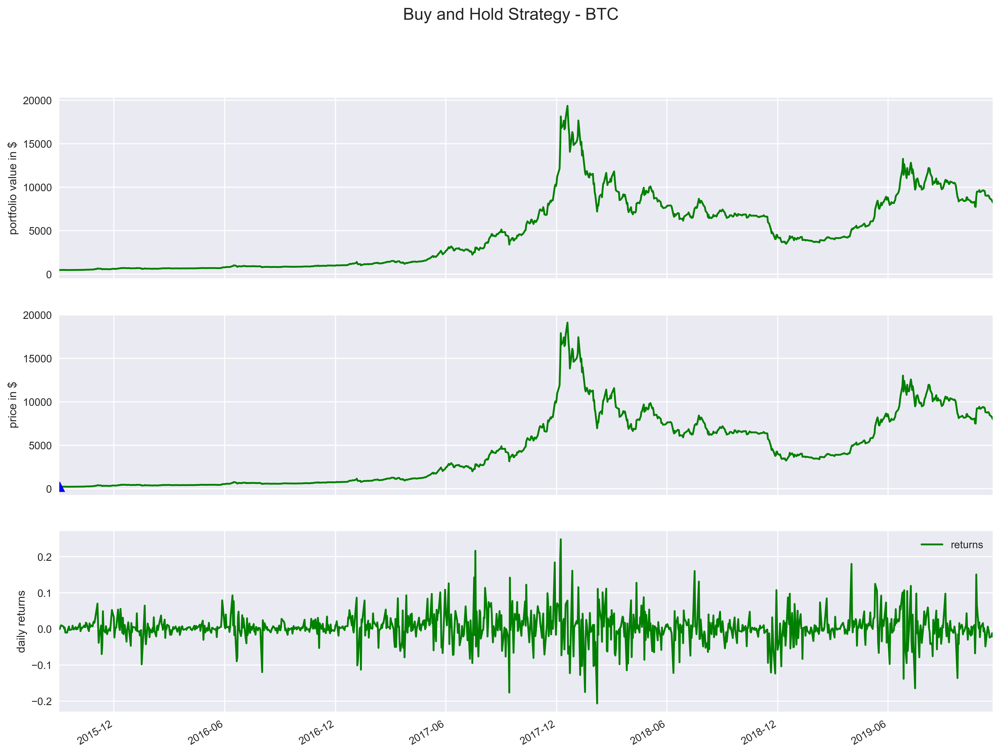

Final portfolio value (including cash): 8268.97$


In [20]:
fig, ax = plt.subplots(3, 1, sharex=True, figsize=[16, 12])

# portfolio value
perf.portfolio_value.plot(ax=ax[0], color='g')
ax[0].set_ylabel('portfolio value in $')

# asset
perf.price.plot(ax=ax[1], color='g')
ax[1].set_ylabel('price in $')

# mark transactions
perf_trans = perf.loc[[t != [] for t in perf.transactions]]
buys = perf_trans.loc[[t[0]['amount'] > 0 for t in perf_trans.transactions]]
sells = perf_trans.loc[[t[0]['amount'] < 0 for t in perf_trans.transactions]]
ax[1].plot(buys.index, perf.price.loc[buys.index], '^', markersize=10, color='b', label='buy')
ax[1].plot(sells.index, perf.price.loc[sells.index], 'v', markersize=10, color='r', label='sell')

# daily returns
perf.returns.plot(ax=ax[2], color='g')
ax[2].set_ylabel('daily returns')

fig.suptitle('Buy and Hold Strategy - BTC', fontsize=16)
plt.legend()
plt.show()

print('Final portfolio value (including cash): {}$'.format(np.round(perf.portfolio_value[-1], 2)))


In [21]:
# Для просмотра транзакций нам необходимо преобразовать столбец транзакции из фрейма данных производительности
pd.DataFrame.from_records([x[0] for x in perf.transactions.values if x != []])

,amount,commission,dt,order_id,price,sid
0,1,None,2015-09-02 20:00:00+00:00,a8c480ea6c1047c7b01639d66f58f5b5,227.29659,Equity(1 [BTC])


In [22]:
# Проверяя столбцы фрейма данных производительности, мы можем увидеть все доступные метрики
perf.columns

Index(['algo_volatility', 'algorithm_period_return', 'alpha',
       'benchmark_period_return', 'benchmark_volatility', 'beta',
       'capital_used', 'ending_cash', 'ending_exposure', 'ending_value',
       'excess_return', 'gross_leverage', 'long_exposure', 'long_value',
       'longs_count', 'max_drawdown', 'max_leverage', 'net_leverage', 'orders',
       'period_close', 'period_label', 'period_open', 'pnl', 'portfolio_value',
       'positions', 'price', 'returns', 'sharpe', 'short_exposure',
       'short_value', 'shorts_count', 'sortino', 'starting_cash',
       'starting_exposure', 'starting_value', 'trading_days', 'transactions',
       'treasury_period_return'],
      dtype='object')

In [24]:
#perf

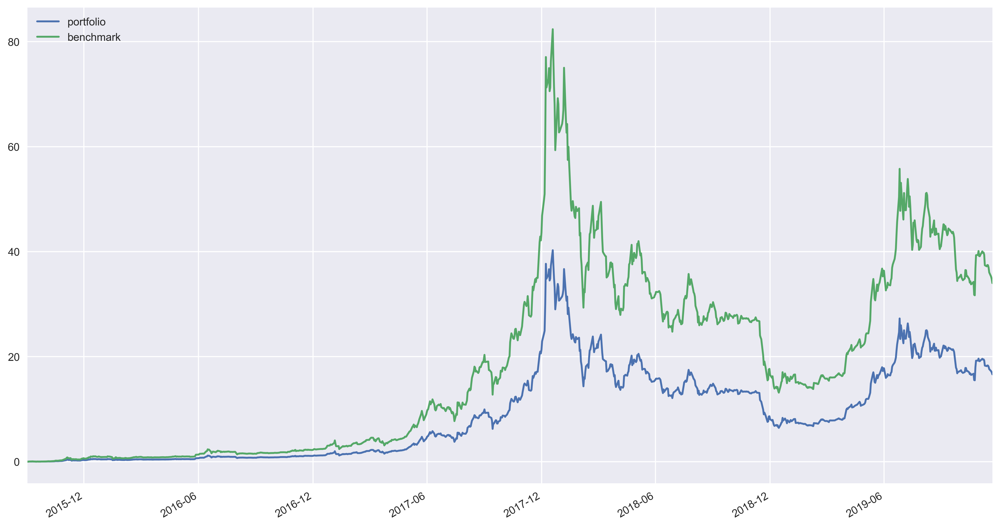

In [25]:
perf.portfolio_value.pct_change().fillna(0).add(1).cumprod().sub(1).plot(label='portfolio')
perf.price.pct_change().fillna(0).add(1).cumprod().sub(1).plot(label='benchmark')
plt.legend(loc=2)

plt.show()

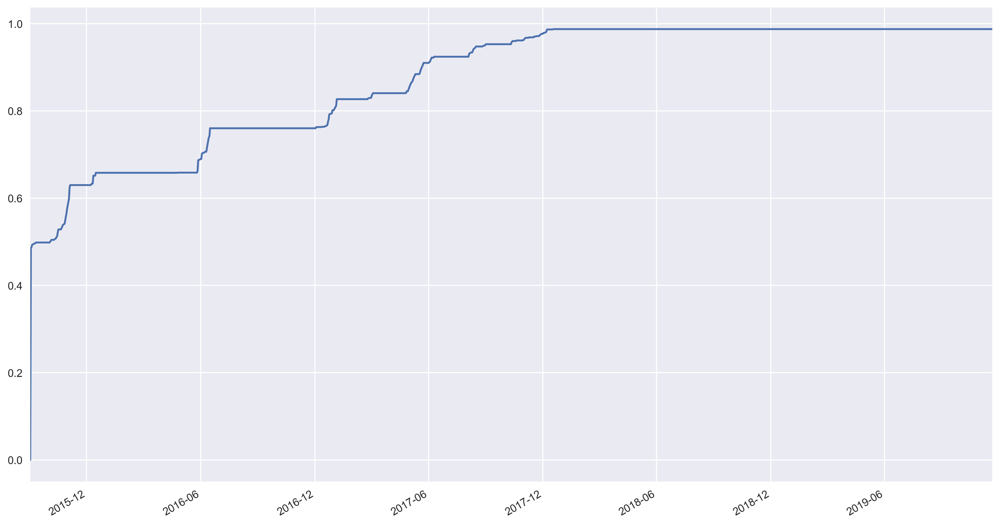

In [27]:
perf.max_leverage.plot()
plt.show()

# 2. Simple Moving Average Strategy

In [28]:
# когда цена пересекает 20-дневный SMA вверх-покупайте акции x
# когда цена пересекает 20-дневный SMA вниз-продавайте акции
# мы можем иметь только максимум X акций в любой момент времени

## Определяем функции алгоритма

In [29]:
# Входные параметры:
ma_periods = 20
selected_stock = 'BTC'
n_stocks_to_buy = 1           # полож. число - покупка; отриц. число - продажа; 0 - продажа всего

In [30]:
def initialize(context):
    context.time = 0
    context.asset = symbol(selected_stock)
    
    # устанавливаем комиссию за сделку
    context.set_commission(commission.PerShare(cost=0, min_trade_cost=0))

In [31]:
def handle_data(context, data):
    
    
    
    # "Период прогрева" - это трюк, используемый для того, чтобы убедиться, что алгоритм имеет достаточно дней для расчета 
    # скользящей средней. Если мы используем несколько метрик с разной длиной окна, мы всегда должны брать самую длинную для разминки
    
    context.time += 1
    if context.time < ma_periods:
        return
    
    
    # Мы получаем доступ к историческим (и текущим) точкам данных с помощью данных.история. 
    # В этом примере мы получаем доступ к последним 20 дням. Данные (в случае одного актива) хранятся в виде панд.
    # Ряды, проиндексированные по времени
    
    price_history = data.history(context.asset, fields="price", bar_count=ma_periods, frequency="1d")
    
    
    # SMA является очень простой мерой, поэтому для расчета я просто беру среднее значение ранее доступных данных

    ma = price_history.mean()
    
    
    #  Я инкапсулировать логику торговой стратегии в случае, если заявление. Для доступа к текущим и предыдущим точкам 
    # данных я использую price_history[-2] и price_history[-1], соответственно. Чтобы увидеть, был ли кроссовер, 
    # я сравниваю текущую и предыдущую цены с MA и определяю, с каким случаем я имею дело (сигнал покупки/продажи). 
    # В случае отсутствия сигнала алгоритм ничего не делает
    
    # cross up
    if (price_history[-2] < ma) & (price_history[-1] > ma):
        order_target(context.asset, n_stocks_to_buy)
    # cross down
    elif (price_history[-2] > ma) & (price_history[-1] < ma):
        order_target(context.asset, 0)

    # save values for later inspection
    record(price=data.current(context.asset, 'price'),
           moving_average=ma)

In [32]:
perf = zipline.run_algorithm(start=datetime(2015, 9, 29, 0, 0, 0, 0, pytz.utc),
                              end=datetime(2019, 1, 1, 0, 0, 0, 0, pytz.utc),
                              initialize=initialize,
                              capital_base=1000,
                              handle_data=handle_data,
                              data=panel)

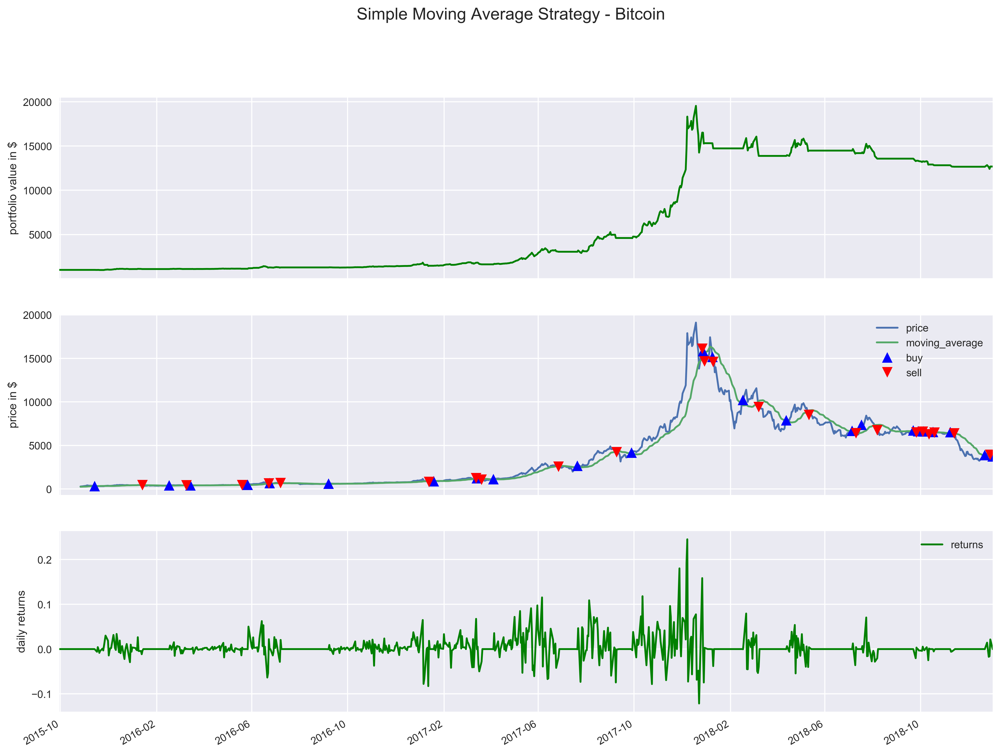

Final portfolio value (including cash): 12684.66$


In [33]:
# Вы можете использовать инструкцию analyze (context, perf) для выполнения дополнительного анализа (например, построения графика) 
# после завершения тестирования. Объект perf-это просто фрейм данных производительности, который мы также храним в файле pickle. 
# Но при использовании внутри алгоритма мы должны ссылаться на него как на perf, и нет необходимости его загружать


fig, ax = plt.subplots(3, 1, sharex=True, figsize=[16, 12])

# portfolio value
perf.portfolio_value.plot(ax=ax[0], color='green')
ax[0].set_ylabel('portfolio value in $')
    
# asset
perf[['price', 'moving_average']].plot(ax=ax[1])
ax[1].set_ylabel('price in $')
    
# mark transactions
perf_trans = perf.loc[[t != [] for t in perf.transactions]]
buys = perf_trans.loc[[t[0]['amount'] > 0 for t in perf_trans.transactions]]
sells = perf_trans.loc[[t[0]['amount'] < 0 for t in perf_trans.transactions]]
ax[1].plot(buys.index, perf.price.loc[buys.index], '^', markersize=10, color='b', label='buy')
ax[1].plot(sells.index, perf.price.loc[sells.index], 'v', markersize=10, color='r', label='sell')
ax[1].legend()
    
# daily returns
perf.returns.plot(ax=ax[2], color='green')
ax[2].set_ylabel('daily returns')

fig.suptitle('Simple Moving Average Strategy - Bitcoin', fontsize=16)
plt.legend()
plt.show()
    
print('Final portfolio value (including cash): {}$'.format(np.round(perf.portfolio_value[-1], 2)))


In [34]:
returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf)

In [35]:
returns.head()

2015-09-29 00:00:00+00:00    0.0
2015-09-30 00:00:00+00:00    0.0
2015-10-01 00:00:00+00:00    0.0
2015-10-02 00:00:00+00:00    0.0
2015-10-05 00:00:00+00:00    0.0
Name: returns, dtype: float64

#### For more advanced strategies, we can allocate a percentage of the capital to each order by using order_percent

In [36]:
positions.tail()

sid,Equity(1 [BTC]),cash
index,,
2018-12-21 00:00:00+00:00,3896.543701,8764.572333
2018-12-24 00:00:00+00:00,4078.599121,8764.572333
2018-12-26 00:00:00+00:00,3857.297607,8764.572333
2018-12-27 00:00:00+00:00,3654.833496,8764.572333
2018-12-31 00:00:00+00:00,3742.700439,8941.957285


#### The transactions DataFrame contains all the transactions executed by the trading strategy — we see both buy and sell orders

In [37]:
transactions.head()

,amount,commission,dt,order_id,price,sid,symbol,txn_dollars
2015-11-13 21:00:00+00:00,1,None,2015-11-13 21:00:00+00:00,4ce72bb3b56d4d1e8056171c550694d6,336.921367,Equity(1 [BTC]),Equity(1 [BTC]),-336.921367
2016-01-13 21:00:00+00:00,-1,None,2016-01-13 21:00:00+00:00,5be21053f614448dac6678a1fe240114,432.154817,Equity(1 [BTC]),Equity(1 [BTC]),432.154817
2016-02-16 21:00:00+00:00,1,None,2016-02-16 21:00:00+00:00,0f24dc139cdf47da8706f8b7a237c17f,407.691751,Equity(1 [BTC]),Equity(1 [BTC]),-407.691751
2016-03-09 21:00:00+00:00,-1,None,2016-03-09 21:00:00+00:00,c3983d0e45114253b3f53ad5463d17fd,414.652555,Equity(1 [BTC]),Equity(1 [BTC]),414.652555
2016-03-14 20:00:00+00:00,1,None,2016-03-14 20:00:00+00:00,be8545f24fb147ddbb941c8a44b8a50a,416.646207,Equity(1 [BTC]),Equity(1 [BTC]),-416.646207


# Создание отчета стратегии

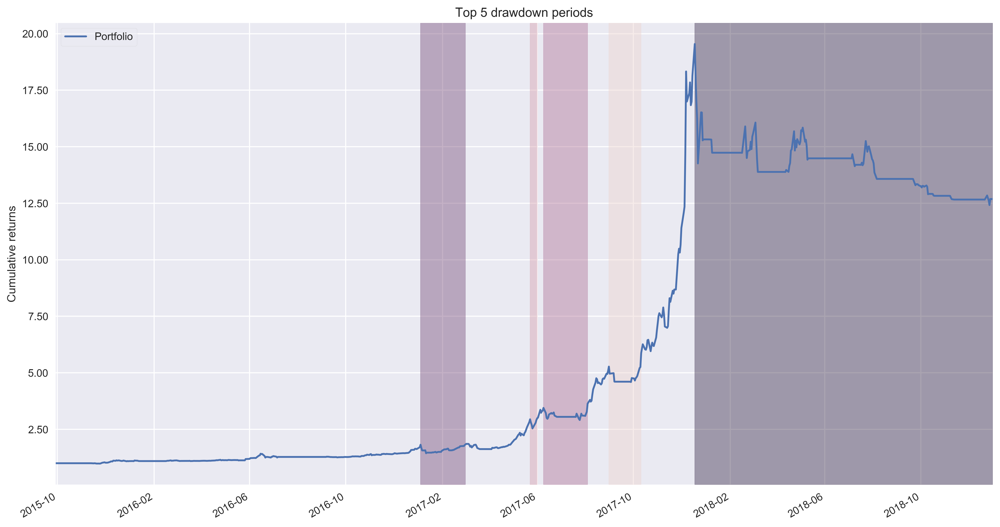

In [38]:
pf.plot_drawdown_periods(returns, top=5)
plt.show()

In [47]:
#print(type(returns))

In [48]:
#returns.tail(20)

Start date,2015-09-29
End date,2018-12-31
Total months,39
,Backtest
Annual return,118.3%
Cumulative returns,1168.5%
Annual volatility,41.9%
Sharpe ratio,2.07
Calmar ratio,3.25
Stability,0.88
Max drawdown,-36.5%


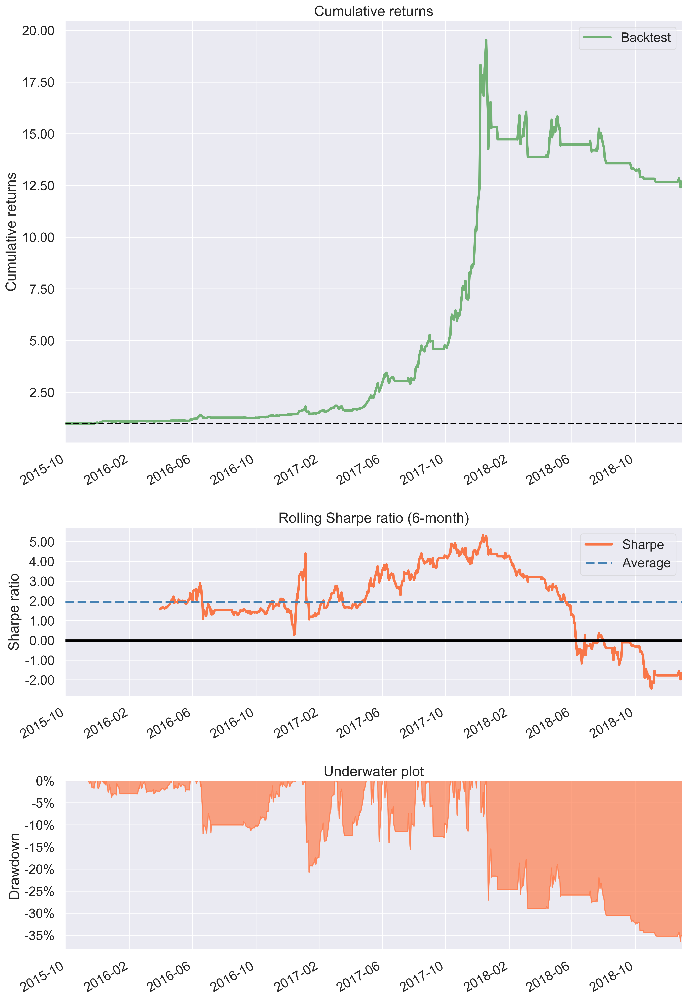

In [41]:
pf.create_simple_tear_sheet(returns)

In [42]:
pf.create_simple_tear_sheet(returns, positions, transactions, live_start_date='2017-01-01')

Start date,2015-09-29
End date,2018-12-31
Total months,39
,Backtest
Annual return,118.3%
Cumulative returns,1168.5%
Annual volatility,41.9%
Sharpe ratio,2.07
Calmar ratio,3.25
Stability,0.88
Max drawdown,-36.5%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,36.45,2017-12-18,2018-12-27,NaT,NaN
1,20.73,2017-01-04,2017-01-11,2017-03-02,42
2,15.55,2017-06-09,2017-07-25,2017-08-04,41
3,13.75,2017-05-23,2017-05-26,2017-06-01,8
4,12.93,2017-08-31,2017-09-28,2017-10-11,30


C:\Users\Alexey\Anaconda3\lib\site-packages\numpy\lib\function_base.py:3834: RuntimeWarning: Invalid value encountered in percentile
  RuntimeWarning)


Stress Events,mean,min,max
Fall2015,0.00%,0.00%,0.00%
New Normal,0.34%,-12.14%,24.51%


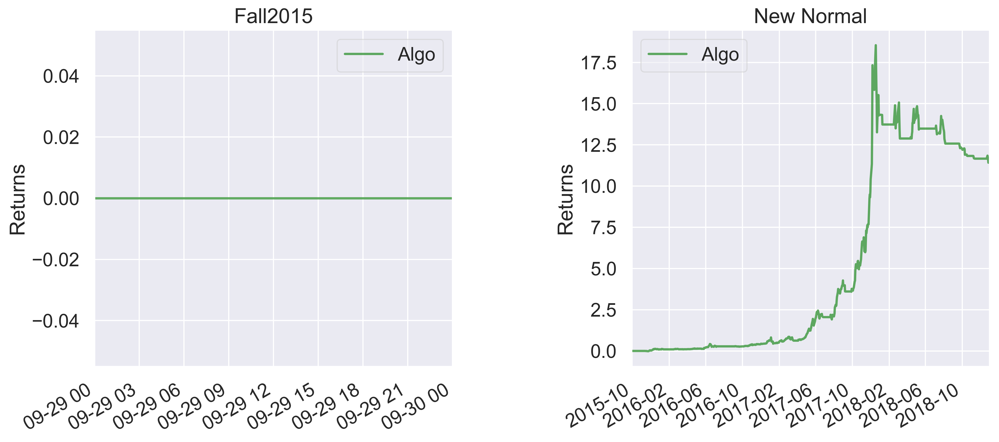

In [44]:
pf.create_full_tear_sheet(returns)

In [46]:
#stock_rets = pf.utils.get_symbol_rets('FB')

# Algorithmic trading based on mean-variance optimization

https://github.com/erykml/medium_articles/blob/master/Quantitative%20Finance/portfolio_optimization_zipline.ipynb

In [47]:
import pypfopt
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns

In [48]:
risky_assets = ['TSLA', 'MSFT', 'FB', 'TWTR']

yahoo_financials = YahooFinancials(risky_assets)
data = yahoo_financials.get_historical_price_data('2019-01-01', '2019-09-30', 'daily')

prices_df = pd.DataFrame({
    asset: {x['formatted_date']: x['adjclose'] for x in data[asset]['prices']} for asset in risky_assets
})
prices_df.head()

,FB,MSFT,TSLA,TWTR
2019-01-02,135.679993,99.646614,310.119995,28.809999
2019-01-03,131.740005,95.980820,300.359985,27.990000
2019-01-04,137.949997,100.444817,317.690002,29.950001
2019-01-07,138.050003,100.572922,334.959991,31.340000
2019-01-08,142.529999,101.302139,335.350006,31.799999


In [49]:
# calculate expected returns and sample covariance amtrix
avg_returns = expected_returns.mean_historical_return(prices_df)
cov_mat = risk_models.sample_cov(prices_df)

In [50]:
# get weights maximizing the Sharpe ratio
ef = EfficientFrontier(avg_returns, cov_mat)
weights = ef.max_sharpe()
cleaned_weights = ef.clean_weights()
cleaned_weights

{'FB': 0.03787, 'MSFT': 0.83889, 'TSLA': 0.0, 'TWTR': 0.12324}

#### For convenience, we use the clean_weights() method, as it truncates very small weights to zero and rounds the rest

In [51]:
# imports
from zipline.api import order_percent, symbols

## Создаем бенчмарк

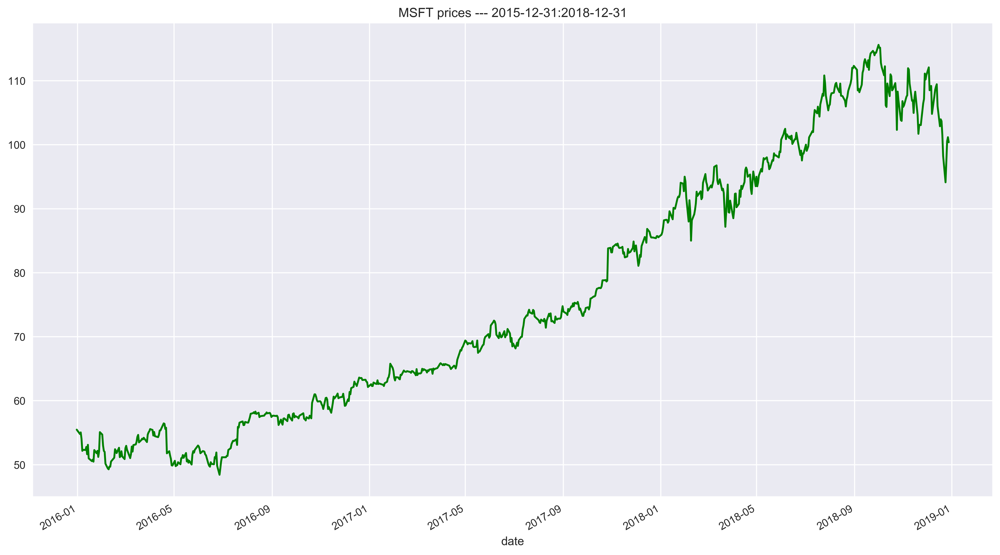

In [52]:
download_csv_data(ticker='MSFT', 
                  start_date='2015-12-31', 
                  end_date='2018-12-31', 
                  freq='daily', 
                  path='data/MSFT.csv')

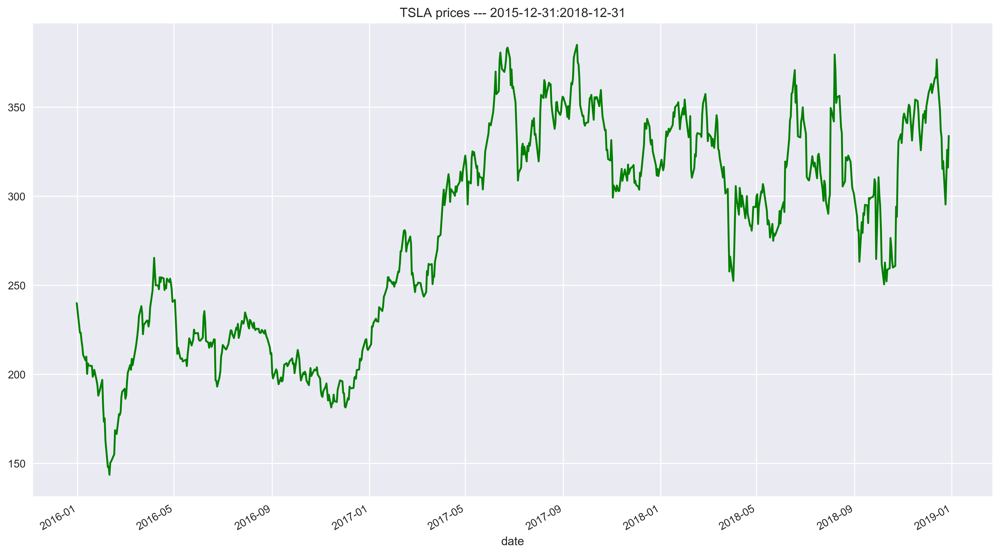

In [53]:
download_csv_data(ticker='TSLA', 
                  start_date='2015-12-31', 
                  end_date='2018-12-31', 
                  freq='daily', 
                  path='data/TSLA.csv')

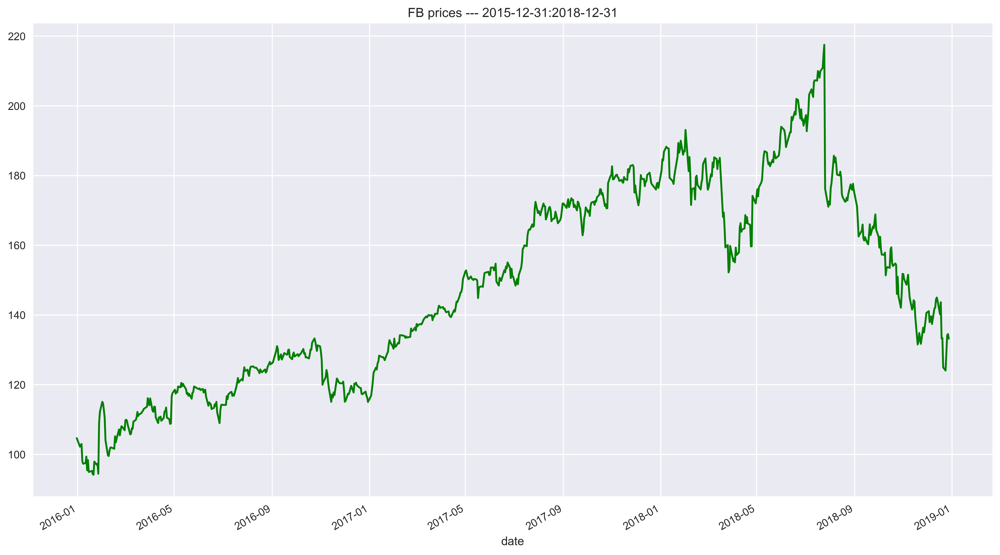

In [54]:
download_csv_data(ticker='FB', 
                  start_date='2015-12-31', 
                  end_date='2018-12-31', 
                  freq='daily', 
                  path='data/FB.csv')

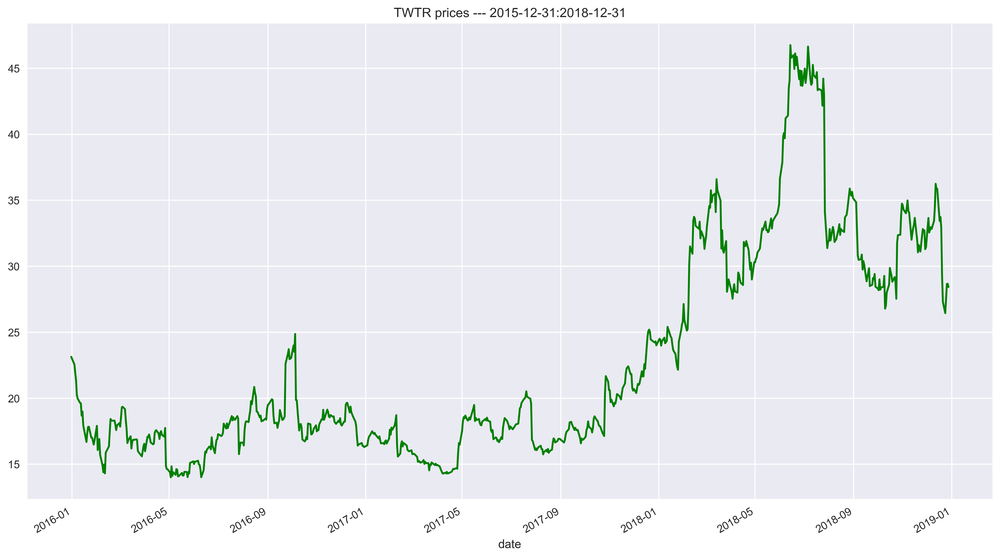

In [55]:
download_csv_data(ticker='TWTR', 
                  start_date='2015-12-31', 
                  end_date='2018-12-31', 
                  freq='daily', 
                  path='data/TWTR.csv')

In [56]:
data = OrderedDict()

tikers = ['FB', 'TSLA', 'MSFT', 'TWTR']

for tiker in tikers:
    data[tiker] = pd.read_csv("data/{}.csv".format(tiker), index_col=0, parse_dates=['date'])
    data[tiker] = data[tiker][["open","high","low","close","volume"]]
    data[tiker] = data[tiker].resample("1d").mean()
    data[tiker].fillna(method="ffill", inplace=True)
    print(data[tiker].head())

                  open        high         low       close      volume
date                                                                  
2015-12-31  106.000000  106.169998  104.620003  104.660004  18391100.0
2016-01-01  106.000000  106.169998  104.620003  104.660004  18391100.0
2016-01-02  106.000000  106.169998  104.620003  104.660004  18391100.0
2016-01-03  106.000000  106.169998  104.620003  104.660004  18391100.0
2016-01-04  101.949997  102.239998   99.750000  102.220001  37912400.0
                  open        high         low       close     volume
date                                                                 
2015-12-31  238.509995  243.449997  238.369995  240.009995  2715000.0
2016-01-01  238.509995  243.449997  238.369995  240.009995  2715000.0
2016-01-02  238.509995  243.449997  238.369995  240.009995  2715000.0
2016-01-03  238.509995  243.449997  238.369995  240.009995  2715000.0
2016-01-04  230.720001  231.380005  219.000000  223.410004  6827100.0
             

In [57]:
panel = pd.Panel(data)
panel.minor_axis = ["open","high","low","close","volume"]
panel.major_axis = panel.major_axis.tz_localize(pytz.utc)
print(panel)

<class 'pandas.core.panel.Panel'>
Dimensions: 4 (items) x 1094 (major_axis) x 5 (minor_axis)
Items axis: FB to TWTR
Major_axis axis: 2015-12-31 00:00:00+00:00 to 2018-12-28 00:00:00+00:00
Minor_axis axis: open to volume


## Реализуем алгоритм бенчмарка

In [58]:
def initialize(context):
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.assets = symbols('FB', 'TSLA', 'MSFT', 'TWTR')
    context.n_assets = len(context.assets)
    context.has_position = False

In [59]:
def handle_data(context, data):
    if not context.has_position:
        for asset in context.assets:
            order_percent(asset, 1/context.n_assets)
        context.has_position = True

In [60]:
benchmark_df = zipline.run_algorithm(start=datetime(2015, 12, 31, 0, 0, 0, 0, pytz.utc),
                              end=datetime(2018, 12, 30, 0, 0, 0, 0, pytz.utc),
                              initialize=initialize,
                              capital_base=50000,
                              handle_data=handle_data,
                              data=panel)

In [61]:
#benchmark_df

We inspect performance of the benchmark strategy by creating a tear sheet

In [62]:
returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(benchmark_df)

The following code generates the tear sheet

In [63]:
#pf.create_returns_tear_sheet(returns, positions, transactions)

We also store some results to compare with the other strategies

In [64]:
benchmark_perf = qf.get_performance_summary(returns)

## Maximum Sharpe ratio portfolio - rebalancing every 30 days

In this strategy, the investor selects such weights that maximize the portfolio's expected Sharpe ratio. The portfolio is rebalanced every 30 trading days.

We determine if a given day is a rebalancing day by using the modulo operation (% in Python) on the current trading day's number (stored in context.time). We rebalance on days when the reminder after the division by 30 is 0.

In [65]:
def initialize(context):
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.assets = symbols('TSLA', 'MSFT', 'FB', 'TWTR')
    context.n_assets = len(context.assets)
    context.window = 252
    context.rebalance_period = 30
    context.time = 0

In [66]:
def handle_data(context, data):
    cleaned_weights = []
    if context.time == 0 or (context.time % context.rebalance_period == 0):
        
        # extract prices
        prices = data.history(context.assets, fields='price',
                              bar_count=context.window + 1, frequency='1d')
        
        # calculate expected returns and sample covariance amtrix
        avg_returns = expected_returns.mean_historical_return(prices)
        cov_mat = risk_models.sample_cov(prices)

        # get weights maximizing the Sharpe ratio
        ef = EfficientFrontier(avg_returns, cov_mat)
        weights = ef.max_sharpe()
        cleaned_weights = ef.clean_weights()

        # submit orders
        for asset in context.assets:
            order_target_percent(asset, cleaned_weights[asset])
    
    record(weights=cleaned_weights)
    context.time += 1

In [67]:
max_sharpe_30_days_df = zipline.run_algorithm(start=datetime(2017, 1, 3, 0, 0, 0, 0, pytz.utc),
                              end=datetime(2018, 12, 30, 0, 0, 0, 0, pytz.utc),
                              initialize=initialize,
                              capital_base=50000,
                              handle_data=handle_data,
                              data=panel)

In [68]:
#max_sharpe_30_days_df

In [69]:
returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(max_sharpe_30_days_df)

Below we extracted the asset allocation:

In [70]:
filtered_weights = max_sharpe_30_days_df.loc[max_sharpe_30_days_df['weights'].map(lambda d: len(d)) > 0, 'weights']

In [71]:
# convert index to datatime
new_index = pd.Series(pd.to_datetime(filtered_weights.index).date).map(lambda x: x.strftime('%Y-%m-%d'))
weights_df = pd.DataFrame.from_records(filtered_weights, index=new_index)

weights_df

,Equity(0 [TWTR]),Equity(1 [TSLA]),Equity(2 [FB]),Equity(3 [MSFT])
2017-01-03,0.00000,0.00000,0.35169,0.64831
2017-02-15,0.00000,0.41999,0.33191,0.24810
2017-03-30,0.00000,0.14647,0.53066,0.32286
2017-05-12,0.05909,0.22321,0.16844,0.54926
2017-06-26,0.00000,0.29129,0.16651,0.54219
2017-08-08,0.00000,0.20527,0.45743,0.33730
2017-09-20,0.00000,0.25554,0.23238,0.51208
2017-11-01,0.00000,0.18108,0.22642,0.59249
2017-12-14,0.00000,0.16204,0.46943,0.36853
2018-01-30,0.05570,0.05881,0.30368,0.58181


<class 'pandas.core.series.Series'>


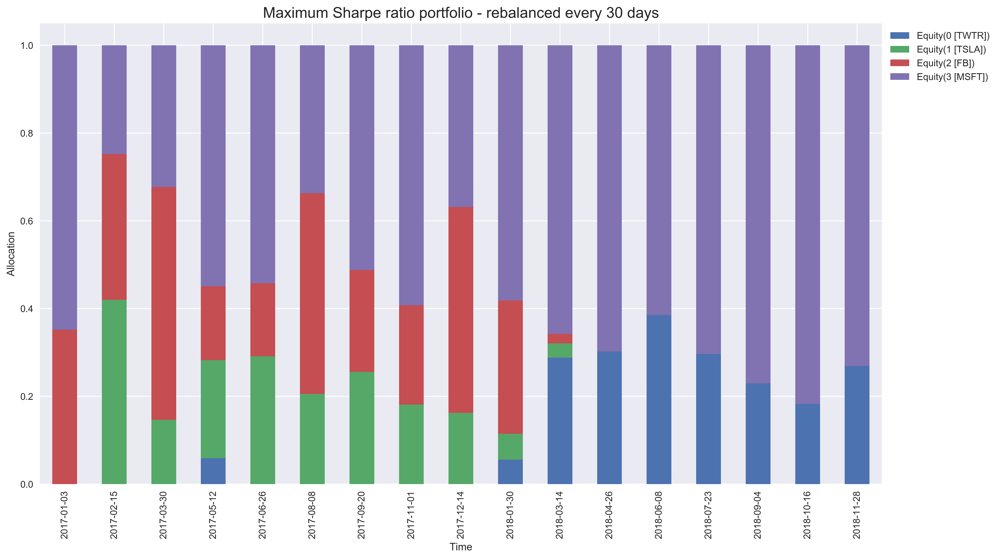

In [72]:
# extract non-empty weights
filtered_weights = max_sharpe_30_days_df.loc[max_sharpe_30_days_df['weights'].map(lambda d: len(d)) > 0, 'weights']
print(type(filtered_weights))

# convert index to datatime
new_index = pd.Series(pd.to_datetime(filtered_weights.index).date).map(lambda x: x.strftime('%Y-%m-%d'))
weights_df = pd.DataFrame.from_records(filtered_weights, index=new_index)

# plot the results
ax = weights_df.plot(kind='bar', stacked=True) 
ax.set(xlabel='Time', ylabel='Allocation')
ax.set_title('Maximum Sharpe ratio portfolio - rebalanced every 30 days', fontsize=16)
ax.legend(bbox_to_anchor=(1,1));

Some of the insights from the plot:

1. there is virtually no investment in Twitter in this strategy
2. sometimes entire months are skipped like Jan 2016 or April 2016. That is because we are rebalancing every 30 trading days and there are on average 21 trading days in a month.

In [73]:
# inspect the transactions 
# transactions

In [74]:
# create the tear sheet
# pf.create_returns_tear_sheet(returns, positions, transactions)

As before, we also store some results for later comparison.

In [76]:
max_sharpe_30_days_perf = qf.get_performance_summary(returns)
max_sharpe_30_days_perf

annual_volatility     0.244090
annualized_returns    0.215914
cumulative_returns    0.476154
max_drawdown         -0.225524
sharpe_ratio          0.923422
sortino_ratio         1.293229
dtype: float64

## Maximum Sharpe ratio portfolio - rebalancing every month

This strategy is very similar to the previous one - we also select weights maximizing the portfolio's expected Sharpe ratio. The difference is in the rebalancing scheme. First, we define the rebalance method which calculates the optimal weights and executes orders accordingly. Then, we schedule it using schedule_function. With the current setting, the rebalancing happens on the last trading day of the month (date_rules.month_end) after the market closes (time_rules.market_close).

In [191]:
def initialize(context):
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.assets = symbols('TSLA', 'MSFT', 'FB', 'TWTR')
    context.n_assets = len(context.assets)
    context.window = 252
    
    schedule_function(rebalance,
                      date_rules.month_end(),
                      time_rules.market_close())

In [192]:
def handle_data(context, data):
    cleaned_weights = []
        
    # extract prices
    prices = data.history(context.assets, fields='price',
                          bar_count=context.window + 1, frequency='1d')

    # calculate expected returns and sample covariance amtrix
    avg_returns = expected_returns.mean_historical_return(prices)
    cov_mat = risk_models.sample_cov(prices)

    # get weights maximizing the Sharpe ratio
    ef = EfficientFrontier(avg_returns, cov_mat)
    weights = ef.max_sharpe()
    cleaned_weights = ef.clean_weights()
    
    # submit orders
    for asset in context.assets:
        order_target_percent(asset, cleaned_weights[asset])
    
    record(weights=cleaned_weights)

In [195]:
max_sharpe_monthly_df = zipline.run_algorithm(start=datetime(2017, 1, 3, 0, 0, 0, 0, pytz.utc),
                                              end=datetime(2018, 12, 30, 0, 0, 0, 0, pytz.utc),
                                              initialize=initialize,
                                              capital_base=50000,
                                              handle_data=handle_data,
                                              data=panel)

In [196]:
returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(max_sharpe_monthly_df)

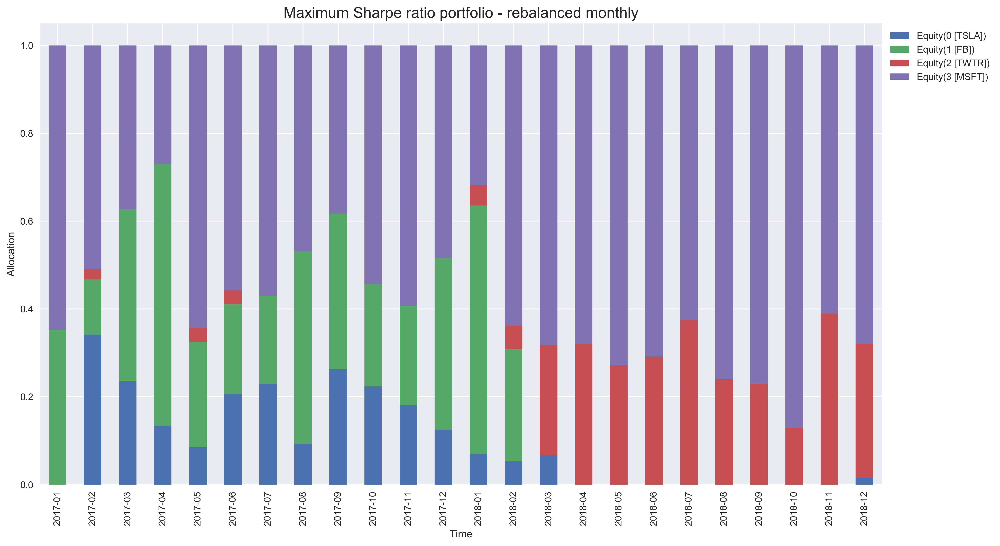

In [197]:
# extract non-empty weights
filtered_weights = max_sharpe_monthly_df.loc[max_sharpe_monthly_df['weights'].map(lambda d: len(d)) > 0, 'weights']

# convert index to datatime
new_index = pd.Series(pd.to_datetime(max_sharpe_monthly_df.weights.index).date).map(lambda x: x.strftime('%Y-%m'))
weights_df = pd.DataFrame.from_records(filtered_weights, index=new_index)

# select only the first value per month to remove duplicates
weights_df = weights_df.groupby(weights_df.index).head(1)

# plot the results
ax = weights_df.plot(kind='bar', stacked=True) 
ax.set(xlabel='Time', ylabel='Allocation')
ax.set_title('Maximum Sharpe ratio portfolio - rebalanced monthly', fontsize=16)
ax.legend(bbox_to_anchor=(1,1));

When rebalancing monthly, we do have entries for all the months. Also, in this case, there are some small investments in Twitter in mid 2017.

In [198]:
max_sharpe_monthly_perf = qf.get_performance_summary(returns)

## Minimum volatility portfolio - rebalancing every month

This time the investors selects the portfolio weights by minimizing the volatility. Thanks to PyPortfolioOpt, this is as easy as changing weights = ef.max_sharpe() to weights = ef.min_volatility().

In [199]:
def initialize(context):
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.assets = symbols('TSLA', 'MSFT', 'FB', 'TWTR')
    context.n_assets = len(context.assets)
    context.window = 252
    
    schedule_function(rebalance,
                      date_rules.month_end(),
                      time_rules.market_close())

In [200]:
def handle_data(context, data):
    cleaned_weights = []
        
    # extract prices
    prices = data.history(context.assets, fields='price',
                          bar_count=context.window + 1, frequency='1d')

    # calculate expected returns and sample covariance amtrix
    avg_returns = expected_returns.mean_historical_return(prices)
    cov_mat = risk_models.sample_cov(prices)

    # get weights maximizing the Sharpe ratio
    ef = EfficientFrontier(avg_returns, cov_mat)
    weights = ef.min_volatility()
    cleaned_weights = ef.clean_weights()
    
    # submit orders
    for asset in context.assets:
        order_target_percent(asset, cleaned_weights[asset])
    
    record(weights=cleaned_weights)

In [202]:
min_vol_month_start_df = zipline.run_algorithm(start=datetime(2017, 1, 3, 0, 0, 0, 0, pytz.utc),
                                              end=datetime(2018, 12, 30, 0, 0, 0, 0, pytz.utc),
                                              initialize=initialize,
                                              capital_base=50000,
                                              handle_data=handle_data,
                                              data=panel)

In [203]:
returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(min_vol_month_start_df)

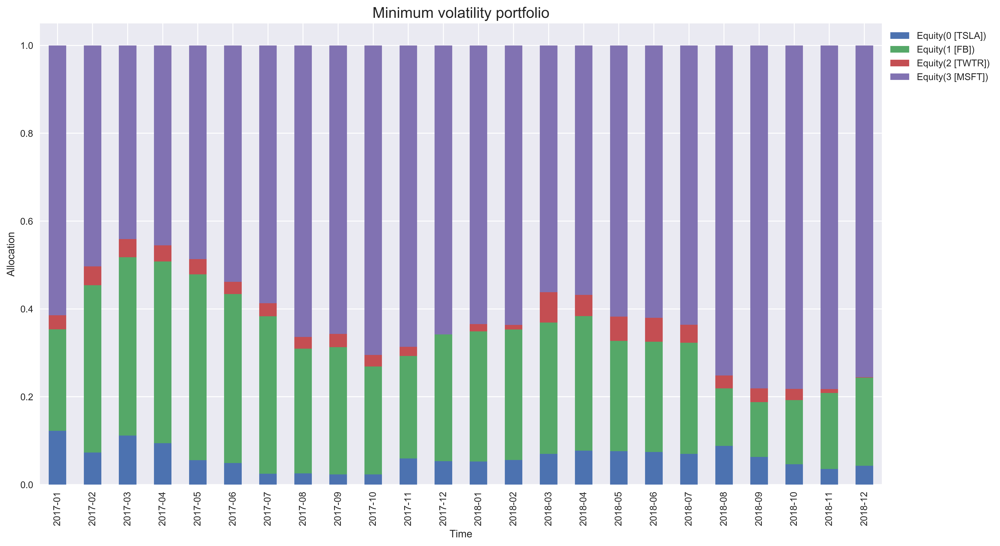

In [204]:

# extract non-empty weights
filtered_weights = min_vol_month_start_df.loc[min_vol_month_start_df['weights'].map(lambda d: len(d)) > 0, 'weights']

# convert index to datatime
new_index = pd.Series(pd.to_datetime(min_vol_month_start_df.weights.index).date).map(lambda x: x.strftime('%Y-%m'))
weights_df = pd.DataFrame.from_records(filtered_weights, index=new_index)

# select only the first value per month to remove duplicates
weights_df = weights_df.groupby(weights_df.index).head(1)

# plot the results
ax = weights_df.plot(kind='bar', stacked=True) 
ax.set(xlabel='Time', ylabel='Allocation')
ax.set_title('Minimum volatility portfolio', fontsize=16)
ax.legend(bbox_to_anchor=(1,1));

The weights generated by the minimum volatility strategy are definitely most stable over time - there is not so much rebalancing from between to consecutive periods. That is certainly important when we account for transaction costs.

In [205]:
min_vol_month_perf = qf.get_performance_summary(returns)

## Comparing the performance

From the comparison below we see that the strategy minimalizing volatility achieved the best returns together with the lowest portfolio volatility. It also performed much better than the strategies maximizing the Sharpe ratio.

Another interesting observation is that all of the custom strategies created using optimization resulted in performance better than naive 1/n allocation combined with buy and hold.

In [206]:
perf_df = pd.DataFrame({'1/n portfolio': benchmark_perf,
                        'Max Sharpe - 30 days rebalancing': max_sharpe_30_days_perf,
                        'Max Sharpe - monthly rebalancing': max_sharpe_monthly_perf,
                        'Min Volatility - monthly rebalancing': min_vol_month_perf})
perf_df.transpose()

,annual_volatility,annualized_returns,cumulative_returns,max_drawdown,sharpe_ratio,sortino_ratio
1/n portfolio,0.247031,0.133775,0.456679,-0.272267,0.632168,0.873584
Max Sharpe - 30 days rebalancing,0.244090,0.215914,0.476154,-0.225524,0.923422,1.293229
Max Sharpe - monthly rebalancing,0.245693,0.187069,0.407216,-0.238177,0.821210,1.146067
Min Volatility - monthly rebalancing,0.221769,0.226338,0.501473,-0.229606,1.031226,1.462812
